The purpose of this analysis is to explore the datasets and identify potential data-quality issues before the data is used for predictive analytics. Exploratory Data Analysis (EDA) allows me to better understand the structure, distributions, and overall quality of the dataset.
I will begin by loading and inspecting the data, followed by descriptive statistics and an examination of missing values, duplicates, and unusual observations. I will perform basic data-cleaning steps where it is applicable. I will then use YData Profiling to generate a more detailed automated EDA report.

In [2]:
# Install YData Profiling
!pip install ydata-profiling

In [5]:
#EDA Report
from ydata_profiling import ProfileReport

In [6]:
#Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from ydata_profiling import ProfileReport

pd.set_option('display.max_columns', None)

In [7]:
#Load dataset
df = pd.read_csv("eda_data.csv")

df.head()

,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,x13,y
0,-17.933519,6.559220,-14.452810,-4.732855,0.381673,2.563194,"($1,306.52)",-89.394348,-28.454044,-16.201298,-0.01%,0.217010,9.729891,-0.786431,0.666146
1,-37.214754,10.774930,-15.384004,-0.077339,10.983774,-15.210206,($24.86),153.032652,-32.557736,69.675903,0.00%,-3.584908,35.727926,-0.985552,0.378411
2,0.330441,-19.609972,-9.167911,2.064124,12.071688,12.506141,($110.85),-141.437276,-20.794952,55.042604,0.00%,-3.991366,-9.283523,-3.394718,0.624498
3,-13.709765,-8.011390,6.759264,1.727615,-1.768382,24.039733,($324.43),51.039653,-7.046908,-31.424419,0.01%,7.908897,-2.891882,-2.690222,0.126622
4,-4.202598,7.076210,-26.004919,-4.269696,-3.414224,2.115989,"$1,213.37",-31.046700,19.061182,-31.525515,-0.01%,0.846719,25.497480,3.516801,0.640025


Initial Dataset Inspection

Before making any changes, I want to understand the basic structure of the dataset. I am going to examine its dimensions, column names, data types, and several sample records. This step is important because data types and formatting can affect later predictive models and its outcomes.

I am also looking for anything that immediately appears unusual, such as columns stored under the wrong data type, inconsistent naming, or values that are missing, or duplicated.


In [8]:
#Structure the data
print("Dataset shape:", df.shape)

print("\nColumn Names:")
print(df.columns.tolist())

print("\nData Types:")
print(df.dtypes)

print("\nDataset Information:")
df.info()

Dataset shape: (9999, 15)

Column Names:
['x0', 'x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7', 'x8', 'x9', 'x10', 'x11', 'x12', 'x13', 'y']

Data Types:
x0     float64
x1     float64
x2     float64
x3     float64
x4     float64
x5     float64
x6      object
x7     float64
x8     float64
x9     float64
x10     object
x11    float64
x12    float64
x13    float64
y      float64
dtype: object

Dataset Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9999 entries, 0 to 9998
Data columns (total 15 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   x0      9996 non-null   float64
 1   x1      9995 non-null   float64
 2   x2      9996 non-null   float64
 3   x3      9997 non-null   float64
 4   x4      9997 non-null   float64
 5   x5      9999 non-null   float64
 6   x6      9996 non-null   object 
 7   x7      9998 non-null   float64
 8   x8      9999 non-null   float64
 9   x9      9996 non-null   float64
 10  x10     9997 non-null   object 
 11

In [9]:
#Descriptive statistics
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
x0,9996.0,NaN,NaN,NaN,6.501091,29.140034,-106.809919,-13.094564,6.659263,26.214107,114.823451
x1,9995.0,NaN,NaN,NaN,-3.72988,17.237178,-65.137848,-15.356197,-3.82563,7.764036,67.685933
x2,9996.0,NaN,NaN,NaN,-7.335819,38.355015,-150.846091,-33.079854,-7.374468,18.477979,127.204103
x3,9997.0,NaN,NaN,NaN,-0.001323,3.995307,-14.61654,-2.681308,0.010637,2.635699,16.923269
x4,9997.0,NaN,NaN,NaN,1.347141,9.606695,-37.49953,-5.047927,1.217076,7.807128,38.624213
x5,9999.0,NaN,NaN,NaN,1.214413,17.352962,-59.900503,-10.904697,0.814006,12.693538,68.865261
x6,9996,9849,($243.22),3,NaN,NaN,NaN,NaN,NaN,NaN,NaN
x7,9998.0,NaN,NaN,NaN,-4.239862,131.921984,-661.764937,-91.48934,-4.744892,83.831778,476.910533
x8,9999.0,NaN,NaN,NaN,-0.297257,37.987287,-142.719688,-25.685742,-0.239779,25.459537,181.06334
x9,9996.0,NaN,NaN,NaN,-22.48205,91.723733,-427.412374,-79.734745,-20.45986,38.383398,319.592518


Some Descriptive Statistics observations were that most columns are numerical, while "x6" and "x10" appear to contain text or categorical data. I also noticed small differences in the counts, which suggests that several columns have missing values. Some variables, especially "x7", have a much larger range and standard deviation than others, so I will examine them for possible outliers. The target variable "y" ranges from approximately 0 to 1 and has a mean near 0.50. These results give me a better idea of which columns need attention and data cleaning.

In [10]:
#Missing Values
missing = pd.DataFrame({
    "Missing Values": df.isnull().sum(),
    "Percent Missing": (df.isnull().sum() / len(df) * 100).round(2)
})

missing[missing["Missing Values"] > 0].sort_values(
    "Percent Missing", ascending=False
)

,Missing Values,Percent Missing
x1,4,0.04
x11,4,0.04
x0,3,0.03
x2,3,0.03
x6,3,0.03
x9,3,0.03
x3,2,0.02
x4,2,0.02
x10,2,0.02
x7,1,0.01


In [11]:
#Duplicate Values
duplicate_count = df.duplicated().sum()

print("Number of duplicate rows:", duplicate_count)

Number of duplicate rows: 0


I checked for duplicates and the duplicate count showed zero. So while there are no duplicates, I did find multiple missing values. 

In [13]:
#Unique Values
categorical_columns = df.select_dtypes(include=["object", "category"]).columns

for column in categorical_columns:
    print(f"\n--- {column} ---")
    print(df[column].value_counts(dropna=False).head(20))


--- x6 ---
x6
($243.22)     3
NaN           3
$1,732.87     2
($432.40)     2
($35.66)      2
($302.71)     2
$630.88       2
$824.89       2
$156.67       2
$298.84       2
($999.65)     2
$206.78       2
($659.37)     2
$1,481.42     2
$841.54       2
$792.39       2
($538.70)     2
$411.45       2
($344.49)     2
($98.53)      2
Name: count, dtype: int64

--- x10 ---
x10
0.00%     3914
-0.01%    2409
0.01%     2361
0.02%      581
-0.02%     579
0.03%       73
-0.03%      72
-0.04%       4
0.04%        4
NaN          2
Name: count, dtype: int64


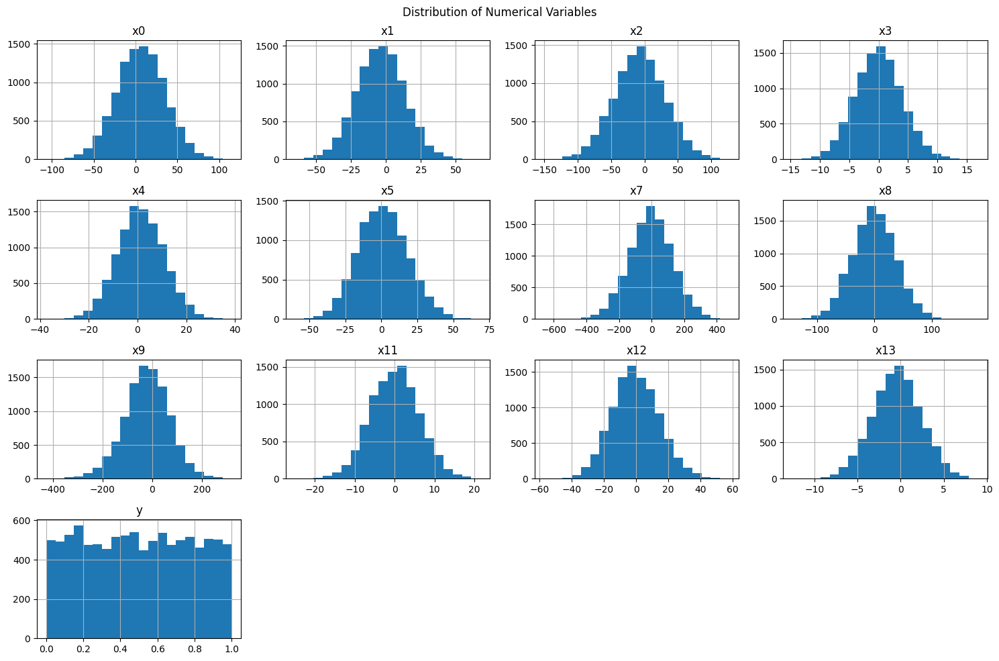

In [14]:
#Checking for Numeric Distribution
numeric_columns = df.select_dtypes(include=np.number).columns

df[numeric_columns].hist(figsize=(15, 10), bins=20)

plt.suptitle("Distribution of Numerical Variables")
plt.tight_layout()
plt.show()

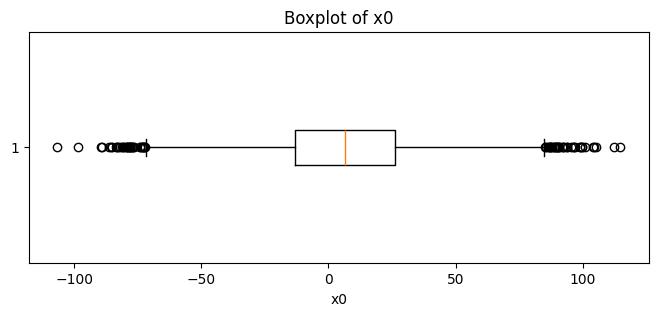

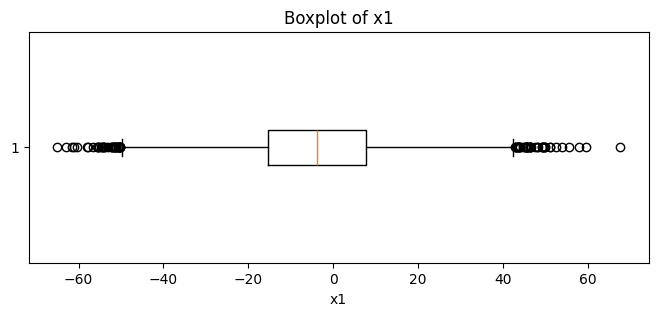

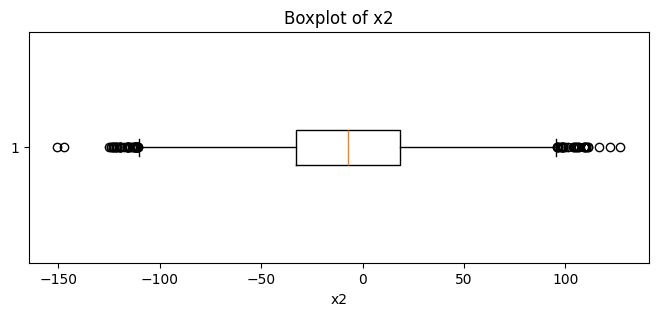

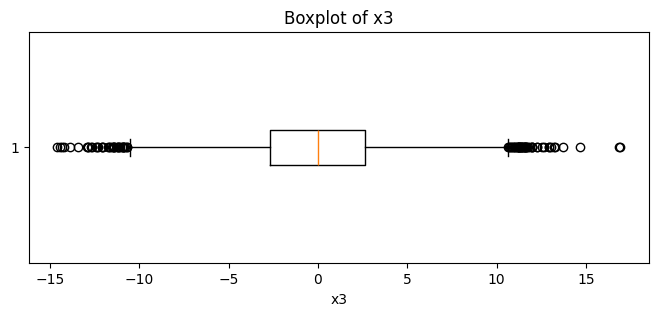

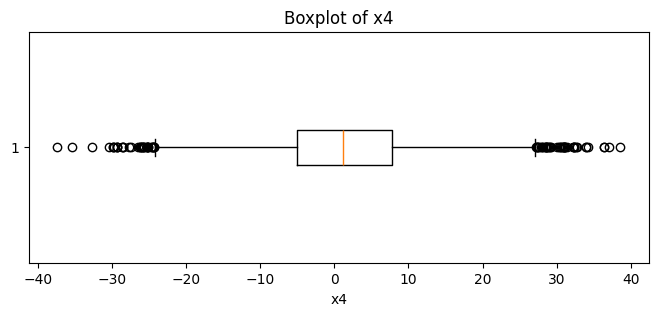

...

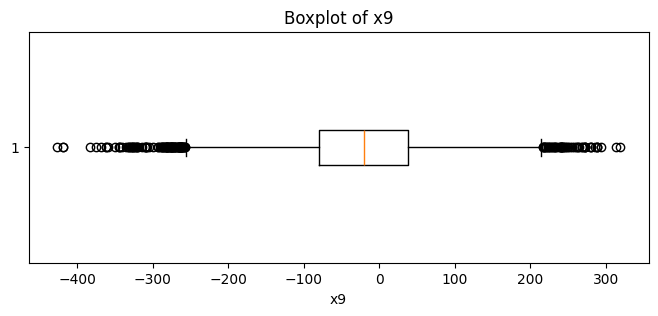

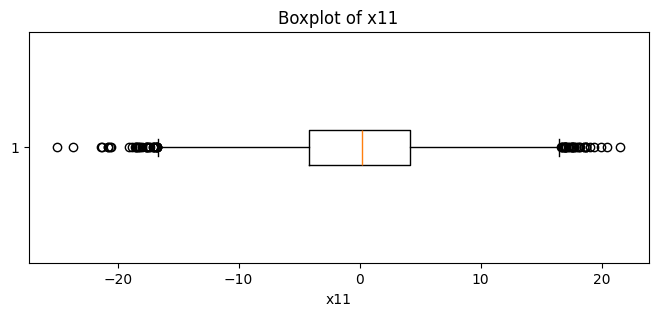

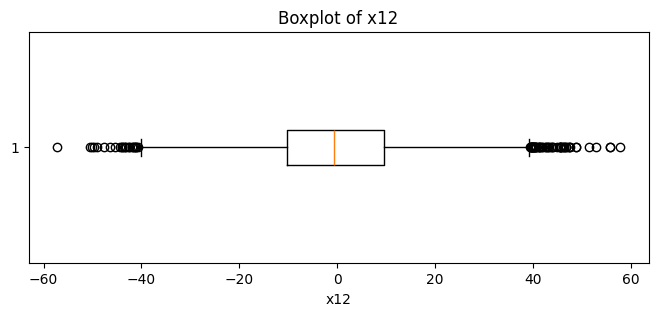

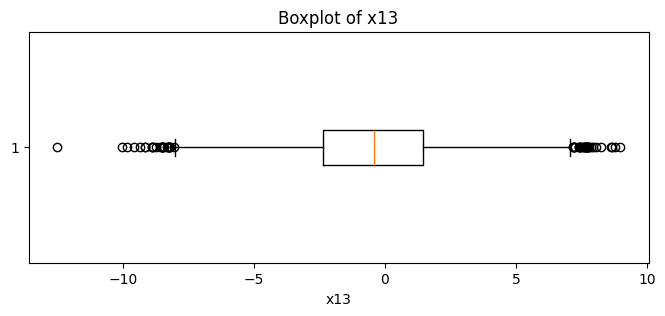

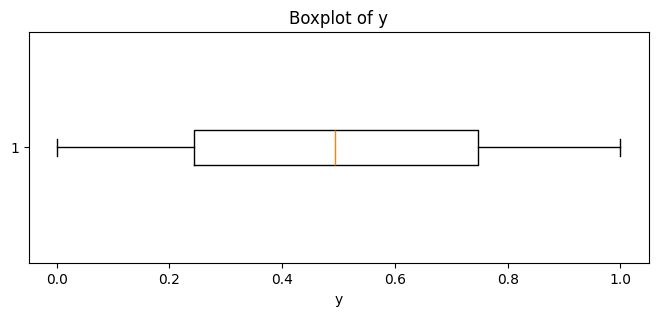

In [15]:
#boxplot
for column in numeric_columns:
    plt.figure(figsize=(8, 3))
    plt.boxplot(df[column].dropna(), vert=False)
    plt.title(f"Boxplot of {column}")
    plt.xlabel(column)
    plt.show()

The EDA showed that most numerical variables have roughly bell-shaped distributions. Although there are some potential outliers visible in the boxplots, I'm not automatically removing them because they may represent valid observations that we may see later on. I found no duplicates, but there are some missing values. Two columns require additional cleaning: "x6" has currency values stored as text, while "x10" has percentages stored as text. I will convert these columns to numerical values before handling the rest of the missing data.


In [16]:
#Create an original copy
df_clean = df.copy()

df_clean.head()

,x0,x1,x2,x3,x4,x5,x6,x7,x8,x9,x10,x11,x12,x13,y
0,-17.933519,6.559220,-14.452810,-4.732855,0.381673,2.563194,"($1,306.52)",-89.394348,-28.454044,-16.201298,-0.01%,0.217010,9.729891,-0.786431,0.666146
1,-37.214754,10.774930,-15.384004,-0.077339,10.983774,-15.210206,($24.86),153.032652,-32.557736,69.675903,0.00%,-3.584908,35.727926,-0.985552,0.378411
2,0.330441,-19.609972,-9.167911,2.064124,12.071688,12.506141,($110.85),-141.437276,-20.794952,55.042604,0.00%,-3.991366,-9.283523,-3.394718,0.624498
3,-13.709765,-8.011390,6.759264,1.727615,-1.768382,24.039733,($324.43),51.039653,-7.046908,-31.424419,0.01%,7.908897,-2.891882,-2.690222,0.126622
4,-4.202598,7.076210,-26.004919,-4.269696,-3.414224,2.115989,"$1,213.37",-31.046700,19.061182,-31.525515,-0.01%,0.846719,25.497480,3.516801,0.640025


In [17]:
#Convert "x6" to Numerical 
df_clean["x6"] = (
    df_clean["x6"]
    .str.replace("$", "", regex=False)
    .str.replace(",", "", regex=False)
    .str.replace("(", "-", regex=False)
    .str.replace(")", "", regex=False)
)

df_clean["x6"] = pd.to_numeric(df_clean["x6"], errors="coerce")

df_clean["x6"].head()

0   -1306.52
1     -24.86
2    -110.85
3    -324.43
4    1213.37
Name: x6, dtype: float64

Cleaning "x6" observations: The "x6" column was stored as text because the values contained dollar signs, commas, and parentheses. I removed the currency formatting and converted the column to numeric values. Values shown in parentheses were converted to negative numbers so their original value was preserved.

In [18]:
#Convert "x10" to Numerical
df_clean["x10"] = (
    df_clean["x10"]
    .str.replace("%", "", regex=False)
)

df_clean["x10"] = pd.to_numeric(df_clean["x10"], errors="coerce") / 100

df_clean["x10"].value_counts(dropna=False)

x10
 0.0000    3914
-0.0001    2409
 0.0001    2361
 0.0002     581
-0.0002     579
 0.0003      73
-0.0003      72
-0.0004       4
 0.0004       4
 NaN          2
Name: count, dtype: int64

Cleaning "x10" observations: The "x10" column contained percentages, which caused Pandas to treat it as text. I removed the percent symbols and converted the values to numeric decimal form. This will allow the variable to be included in numerical analysis later.

In [19]:
#Recheck data to see if they are numeric
df_clean.dtypes

x0     float64
x1     float64
x2     float64
x3     float64
x4     float64
x5     float64
x6     float64
x7     float64
x8     float64
x9     float64
x10    float64
x11    float64
x12    float64
x13    float64
y      float64
dtype: object

In [20]:
#recheck for missing values
missing_clean = pd.DataFrame({
    "Missing Values": df_clean.isnull().sum(),
    "Percent Missing": (df_clean.isnull().sum() / len(df_clean) * 100).round(2)
})

missing_clean[missing_clean["Missing Values"] > 0]

,Missing Values,Percent Missing
x0,3,0.03
x1,4,0.04
x2,3,0.03
x3,2,0.02
x4,2,0.02
x6,3,0.03
x7,1,0.01
x9,3,0.03
x10,2,0.02
x11,4,0.04


The missing-value check shows that only a small percentage of data is missing in several predictor columns. Since the amount of missing data is very small, I will fill the missing numerical values using the median of each column. I am using the median because it is less affected by extreme values than the mean.

In [21]:
#Fill missing numeric predictor values with the median
numeric_columns = df_clean.select_dtypes(include=np.number).columns

for column in numeric_columns:
    df_clean[column] = df_clean[column].fillna(df_clean[column].median())

In [22]:
#Confirm no missing values 
df_clean.isnull().sum()

x0     0
x1     0
x2     0
x3     0
x4     0
x5     0
x6     0
x7     0
x8     0
x9     0
x10    0
x11    0
x12    0
x13    0
y      0
dtype: int64

After replacing the missing numerical values with each column's median, there are no remaining missing values in the cleaned dataset. This keeps nearly all of the original observations (as close as possible anyway) while preparing the data for further analysis.

In [23]:
#recheck data 
df_clean.dtypes

x0     float64
x1     float64
x2     float64
x3     float64
x4     float64
x5     float64
x6     float64
x7     float64
x8     float64
x9     float64
x10    float64
x11    float64
x12    float64
x13    float64
y      float64
dtype: object

In [24]:
#Descriptive statistics post-cleaning
df_clean.describe().T

,count,mean,std,min,25%,50%,75%,max
x0,9999.0,6.501138e+00,29.135661,-106.809919,-13.091886,6.659263,26.196314,114.823451
x1,9999.0,-3.729918e+00,17.233729,-65.137848,-15.351276,-3.825630,7.761736,67.685933
x2,9999.0,-7.335830e+00,38.349260,-150.846091,-33.072206,-7.374468,18.464243,127.204103
x3,9999.0,-1.320547e-03,3.994907,-14.616540,-2.681270,0.010637,2.635557,16.923269
x4,9999.0,1.347115e+00,9.605734,-37.499530,-5.047231,1.217076,7.802829,38.624213
x5,9999.0,1.214413e+00,17.352962,-59.900503,-10.904697,0.814006,12.693538,68.865261
x6,9999.0,-2.969052e+00,999.409148,-4496.460000,-666.900000,10.705000,675.610000,3701.060000
x7,9999.0,-4.239913e+00,131.915386,-661.764937,-91.485783,-4.744892,83.831101,476.910533
x8,9999.0,-2.972567e-01,37.987287,-142.719688,-25.685742,-0.239779,25.459537,181.063340
x9,9999.0,-2.248144e+01,91.709978,-427.412374,-79.686288,-20.459860,38.364805,319.592518


After cleaning, all variables are stored in numerical form and no missing values remain. The "x6" and "x10" values were converted from text into numbers. 

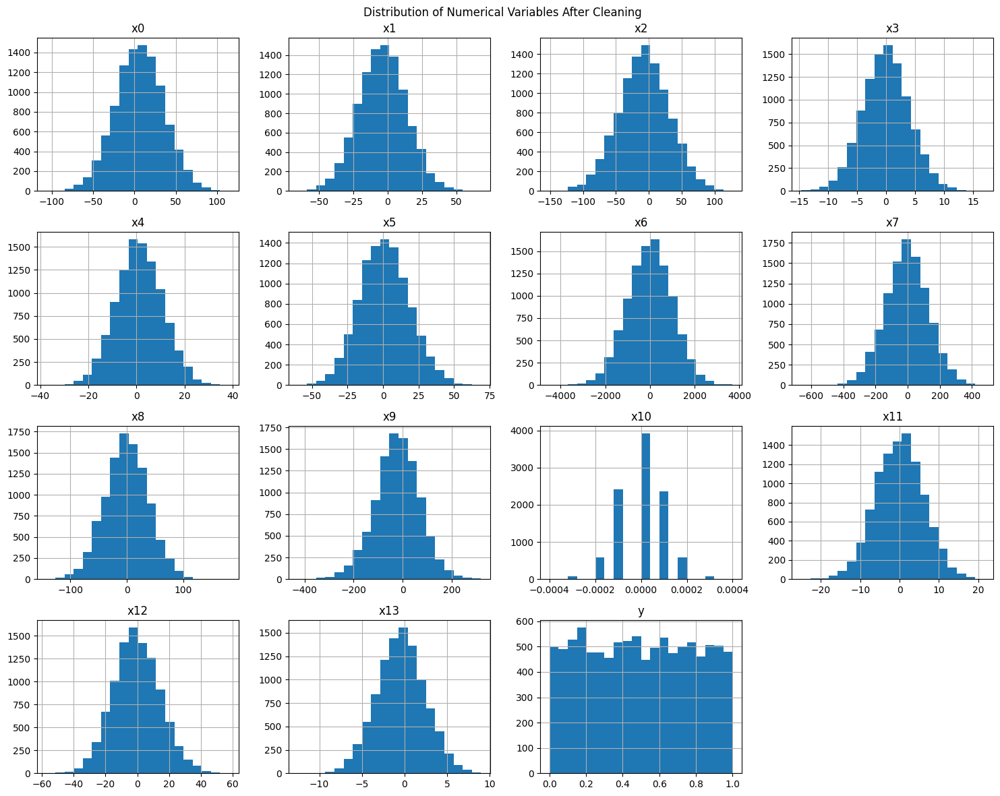

In [27]:
#chart check
numeric_columns_clean = df_clean.select_dtypes(include=np.number).columns

df_clean[numeric_columns_clean].hist(figsize=(15, 12), bins=20)

plt.suptitle("Distribution of Numerical Variables After Cleaning")
plt.tight_layout()
plt.show()

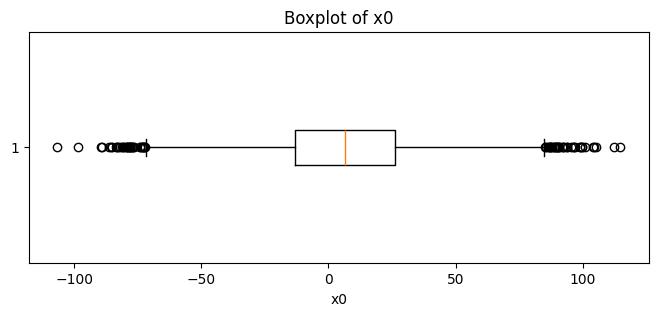

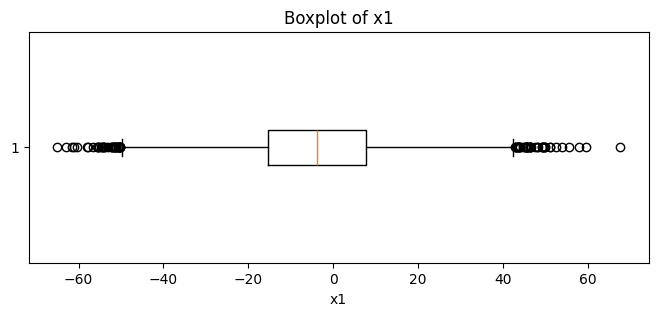

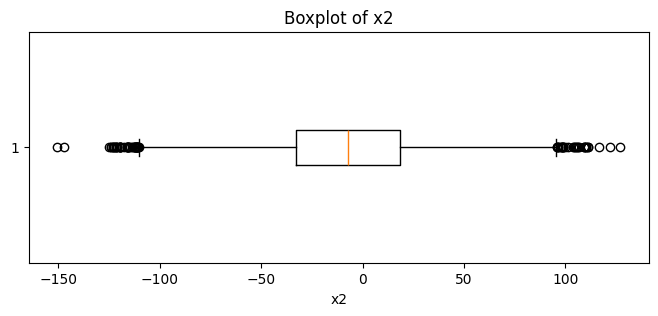

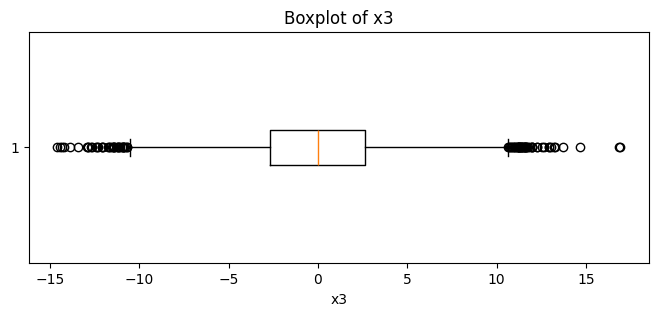

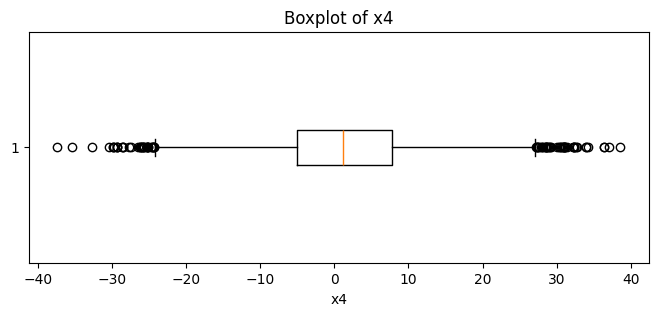

...

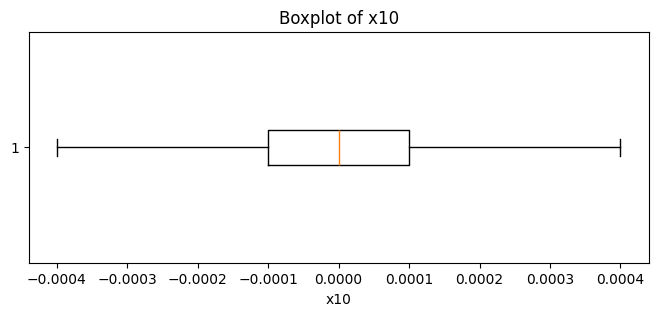

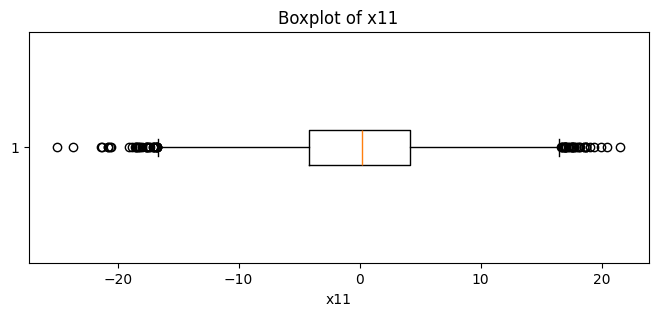

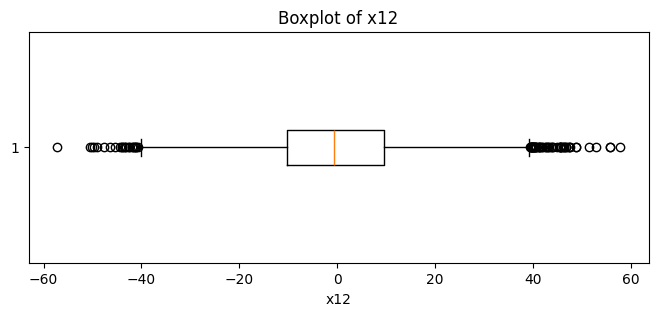

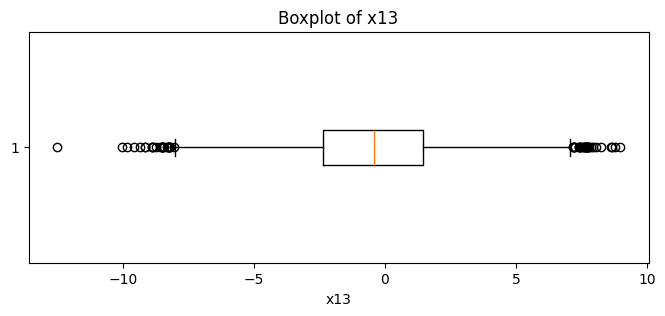

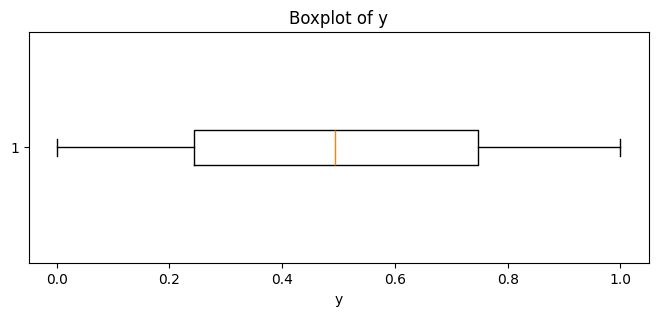

In [28]:
for column in numeric_columns_clean:
    plt.figure(figsize=(8, 3))
    plt.boxplot(df_clean[column].dropna(), vert=False)
    plt.title(f"Boxplot of {column}")
    plt.xlabel(column)
    plt.show()

Outliers: The boxplots show several possible outliers in the numerical variables. However, I'm not going to remove them because there is no clear indicators that they are errors. Some extreme outliers may be valid and could contain useful information for future predictive analysis.

In [30]:
#Create profiling report
from ydata_profiling import ProfileReport

profile = ProfileReport(
    df_clean,
    title="EDA Data Profiling Report",
    explorative=True
)

profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 15/15 [00:00<00:00, 355.89it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [31]:
#save the report
profile.to_file("eda_data_profile_report.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Profile Observation: The YData Profiling report gave me a more detailed overview. This helped confirm that I addressed the missing values and conversions needed for the analysis cleaning. It also gave me a closer look at the distributions and relationships between the variables. This supported what I saw in my histograms and boxplots, including the different ranges between variables and the presence of possible extreme values.

In conclusion, my EDA identified several issues that needed to be addressed before using this dataset for predictive analysis. The original dataset contained no duplicate rows. Several predictor columns had a small number of missing values, which I replaced with their median because the boxplots showed possible extreme values. I also found that "x6" and "x10" contained text and needed to be converted to numerical values- which I addressed. The histograms showed that most of the numerical predictors had roughly bell-shaped distributions, while y ranged from 0 to 1. The boxplots also identified several possible outliers, but I chose to keep them because I did not find evidence that they were errors. After cleaning, all 15 variables were numerical and no missing values remained. Overall, the manual EDA and YData Profiling report helped me create a cleaner dataset that is better prepared for future predictive modeling.